In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from skimage import io
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

In [2]:
df = pd.read_csv('../datasets/movies.csv')
df.head(n=3)

,id,imdb_id,title,genres,original_language,overview,popularity,production_companies,release_date,budget,...,runtime,status,tagline,vote_average,vote_count,credits,keywords,poster_path,backdrop_path,recommendations
0,414906,tt1877830,The Batman,Crime-Mystery-Thriller,en,In his second year of fighting crime Batman un...,8195.597,6th & Idaho-Dylan Clark Productions-DC Films-W...,2022-03-01,185000000,...,176.0,Released,Unmask the truth.,7.8,4165,Robert Pattinson-Zoë Kravitz-Paul Dano-Jeffrey...,crime fighter-secret identity-nightclub-politi...,/74xTEgt7R36Fpooo50r9T25onhq.jpg,/tRS6jvPM9qPrrnx2KRp3ew96Yot.jpg,335787-508947-696806-777270-833425-718032-5050...
1,634649,tt10872600,Spider-Man: No Way Home,Action-Adventure-Science Fiction,en,Peter Parker is unmasked and no longer able to...,4716.995,Marvel Studios-Pascal Pictures-Columbia Pictures,2021-12-15,200000000,...,148.0,Released,The Multiverse unleashed.,8.1,12300,Tom Holland-Zendaya-Benedict Cumberbatch-Jacob...,new york city-loss of loved one-showdown-secre...,/1g0dhYtq4irTY1GPXvft6k4YLjm.jpg,/iQFcwSGbZXMkeyKrxbPnwnRo5fl.jpg,646380-624860-568124-524434-580489-425909-4766...
2,799876,tt14114802,The Outfit,Drama-Thriller-Crime,en,Leonard is an English tailor who used to craft...,2752.077,Focus Features-FilmNation Entertainment-Unifie...,2022-02-25,0,...,105.0,Released,Everyone has something up their sleeve.,7.0,161,Mark Rylance-Zoey Deutch-Dylan O'Brien-Johnny ...,chicago illinois-murder-organized crime-mobste...,/ieOVuwnoFC49m7bekmdQ4AynciS.jpg,/2n95p9isIi1LYTscTcGytlI4zYd.jpg,294793-760104-628900-606402-406759-811631-8799...


<h3>Filtering and feature extration</h3>

In [3]:
import nltk
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
from nltk.corpus import wordnet, stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/klebervasconcelos/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/klebervasconcelos/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/klebervasconcelos/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [4]:
def lemmatization():
    #Filling the missing values with empty string
    df['overview'] = df['overview'].fillna('')

    #Tokenizing the words (splitting the string words )
    df['overview'] = df['overview'].str.lower().apply(word_tokenize)
    
    #Setting the pos tag for each word
    df['overview'] = df['overview'].apply(nltk.tag.pos_tag)


    #Converting pos to wordnet format
    def get_wordnet_pos(tag):
        if tag.startswith('J'):
            return wordnet.ADJ
        elif tag.startswith('V'):
            return wordnet.VERB
        elif tag.startswith('N'):
            return wordnet.NOUN
        elif tag.startswith('R'):
            return wordnet.ADV
        else:
            return wordnet.NOUN
        
    #Applying the function to each word in each review
    df['overview']= df['overview'].apply(lambda x: [(word, get_wordnet_pos(pos)) for (word, pos) in x])

    #Lemmatizing each word
    lemmatizer = WordNetLemmatizer()
    
    df['overview'] = df['overview'].apply(lambda x: [lemmatizer.lemmatize(word, pos) for (word, pos) in x])

    #Joining the words back to string
    df['overview'] = df['overview'].apply(lambda x:''.join(x))


In [5]:
#Dropping duplicated values
df.drop_duplicates(inplace=True, ignore_index=True)

#Filling the missing values with empty string
df.fillna(value={i: ' ' for i in ['overview', 'genres', 'keywords', 'credits']}, inplace=True)


# lambda func for str split join
strOp= lambda x: ' '.join(x.split('-'))

df.overview = df.overview + df.keywords.apply(strOp) + df.genres.apply(strOp) + df.credits.apply(lambda x: ' '.join(x.replace(' ', '').split('-')[:3]))

#Define a TF-IDF Vectorizer Object. Remove all english stop words such as 'the', 'a'
tfidf = TfidfVectorizer(stop_words='english')

#Construct the required TF-IDF matrix by fitting and transforming the data
tfidf_matrix = tfidf.fit_transform(df['overview'])

display(pd.DataFrame(
    tfidf_matrix[:10, 7000:7070].toarray(),
    columns= tfidf.get_feature_names_out()[7000:7070],
    index = df.title[:10]).round())

print(tfidf_matrix.shape)

,actionmattfarley,actionmatthewchamp,actionmatthewmercer,actionmatthewmodine,actionmatthewreese,actionmatthewwillig,actionmatthewwolf,actionmatthiasschoenaerts,actionmattmccolm,actionmattmccoy,...,actionmichaelbeck,actionmichaelbell,actionmichaelbiehn,actionmichaelbloom,actionmichaelbowen,actionmichaelbrandon,actionmichaelbrianrawlins,actionmichaelbugard,actionmichaelcaine,actionmichaelcera
title,,,,,,,,,,,,,,,,,,,,,
The Batman,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Spider-Man: No Way Home,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
The Outfit,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Turning Red,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Sonic the Hedgehog 2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Yaksha: Ruthless Operations,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Moonfall,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Uncharted,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
All the Old Knives,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


(230160, 460309)


<h3>Recommender Function</h3>

In [42]:
# Function that takes in movie title as input and outputs most similar movies
def get_recommendations(title, n):
    idx = []
    for i in range(len(title)):

        # Get the index of the movie that matches the title

        idx.append(df.index[df['title'] == title[i]][0])
        print(idx)
        # show given movie poster
        try:
            a = io.imread(f'https://image.tmdb.org/t/p/w500/{df.loc[idx[i], "poster_path"]}')
            plt.imshow(a)
            plt.axis('off')
            plt.title(title[i])
            plt.show()
        except:pass
        
    print('Recommendations\n')

    # Get the similarity score of both movies
    movie_1_score =  cosine_similarity(tfidf_matrix, tfidf_matrix[idx[0]])
    movie_2_score =  cosine_similarity(tfidf_matrix, tfidf_matrix[idx[1]])
 

    # Calculating the average score of the two movies
    avg_similarity_score = np.mean([movie_1_score, movie_2_score], axis=0)
    print(avg_similarity_score)

    sim_scores = list(enumerate(avg_similarity_score))

    # Sort the movies based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    print(sim_scores)
    # Get the scores of the 10 most similar movies
    sim_scores = sim_scores[1:10]

    # Get the movie indices
    movie_indices = [i[0] for i in sim_scores]

    # Return the top 10 most similar movies
    result = df.iloc[movie_indices]
    
    # show reco. movie posters
    fig, ax = plt.subplots(3, 3, figsize=(15,20))
    ax=ax.flatten()
    for i, j in enumerate(result.poster_path):
        try:
            ax[i].axis('off')
            ax[i].set_title(result.iloc[i].title,fontsize=22)
            a = io.imread(f'https://image.tmdb.org/t/p/w500/{j}')
            ax[i].imshow(a)
        except: pass
    fig.tight_layout()
    fig.show()

[958]


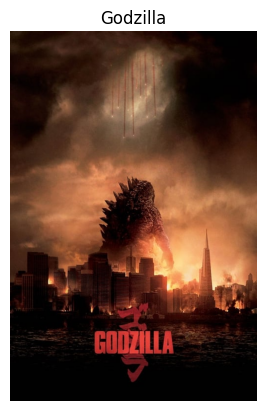

[958, 7234]


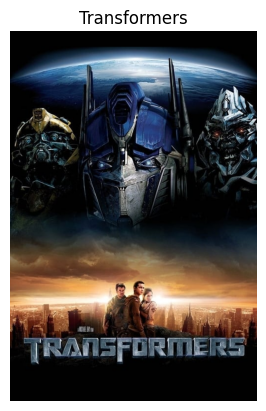

Recommendations

[[0.00430515]
 [0.04885869]
 [0.00150257]
 ...
 [0.00793484]
 [0.00170898]
 [0.        ]]
[(958, array([0.50729394])), (7234, array([0.50729394])), (1943, array([0.22064056])), (2117, array([0.18226786])), (7668, array([0.17431538])), (724, array([0.16348929])), (192070, array([0.15606791])), (101857, array([0.15452465])), (215597, array([0.15452465])), (165344, array([0.13853372])), (180839, array([0.13004534])), (229896, array([0.12968935])), (77102, array([0.12835445])), (12674, array([0.12055463])), (25268, array([0.11916526])), (13394, array([0.11796462])), (39302, array([0.11723541])), (505, array([0.11573595])), (201623, array([0.11573595])), (548, array([0.11537568])), (5517, array([0.11525467])), (326, array([0.11327061])), (131459, array([0.11233865])), (156004, array([0.11233865])), (7363, array([0.11136096])), (32416, array([0.11040334])), (162555, array([0.1068834])), (14659, array([0.1057322])), (11980, array([0.1056517])), (164163, array([0.10469057])), 

/var/folders/8b/nlm7fd7x3qs60ymkbrb9srdm0000gn/T/ipykernel_1400/2689491567.py:87: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


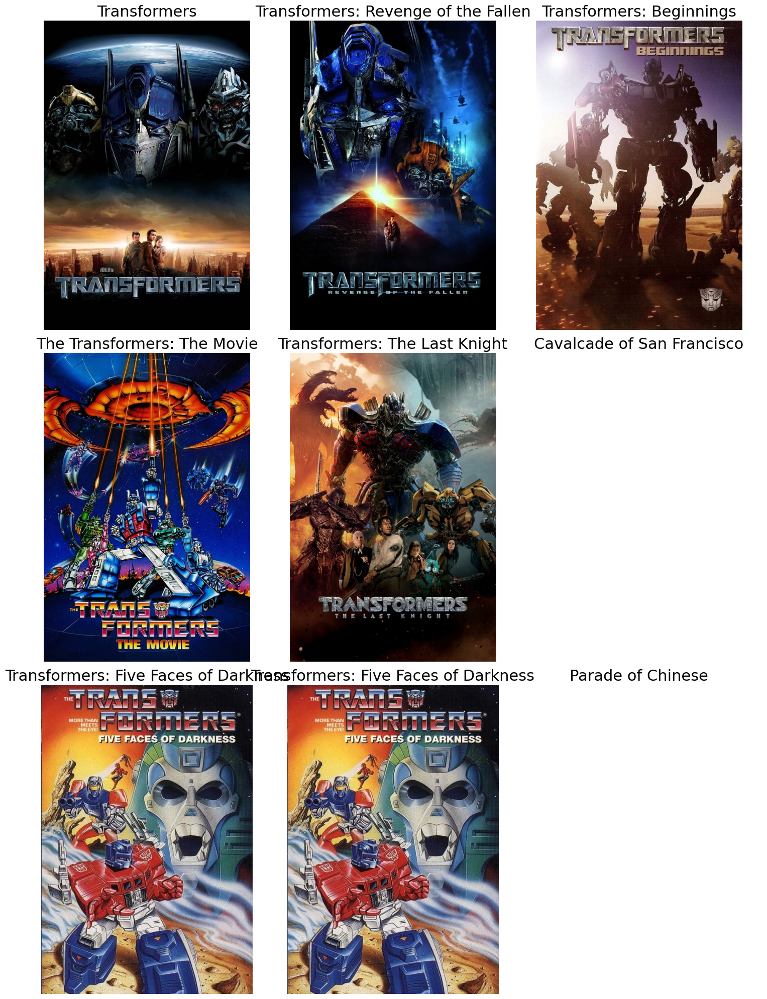

In [45]:
movies = ['Godzilla', 'Transformers']
get_recommendations(movies, len(movies))